# **Data Preparation**

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import Subset

import matplotlib.pyplot as plt
import numpy as np

import torchvision
import torchvision.datasets as DS
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch.utils.data import random_split, DataLoader

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import Dataset
import cv2

class CIFAR10GrayColorPair(Dataset):
    def __init__(self, root, train=True, download=True, transform=None):
        self.color_transform = transforms.Compose([
            transforms.ToTensor(),
           transforms.Resize((256, 256))
        ])

        # Load Flower dataset

        self.color_dataset = datasets.Flowers102(root='data/', split='train',download=True, transform=self.color_transform)


    def __getitem__(self, index):
        color_img, _ = self.color_dataset[index]

        # Convert the tensor to a NumPy array and scale it to 0-255
        color_img_np = color_img.numpy().transpose(1, 2, 0) * 255
        color_img_np = color_img_np.astype(np.uint8)

        # cv2.cvtColor
        yuv_img = cv2.cvtColor(color_img_np, cv2.COLOR_RGB2YUV)

        # Split YUV channels or continue processing as needed
        y_channel = yuv_img[:, :, 0]  # Y channel
        uv_channels = yuv_img[:, :, 1:]  # U and V channels


        # Normalize Y channel to [-1, 1]
        y_channel = torch.from_numpy(yuv_img[:, :, 0].astype(np.float32))
        y_channel = (y_channel / 127.5) - 1.0

        # Normalize UV channels to [-1, 1]
        uv_channels = torch.from_numpy(yuv_img[:, :, 1:].astype(np.float32))
        uv_channels = (uv_channels / 127.5) - 1.0

        return y_channel.unsqueeze(0), uv_channels.permute(2, 0, 1)

    def __len__(self):
        return len(self.color_dataset)

# Usage
root = './data'

cifar10_gray_color_pair_dataset = CIFAR10GrayColorPair(root=root, train=True, download=True)


100%|██████████| 344862509/344862509 [00:12<00:00, 28599478.95it/s]


Extracting data/flowers-102/102flowers.tgz to data/flowers-102


100%|██████████| 502/502 [00:00<00:00, 1840507.52it/s]


100%|██████████| 14989/14989 [00:00<00:00, 36089794.87it/s]


In [ ]:
torch.manual_seed(42)

In [ ]:
# Split the dataset into train and validation sets
train_size = 900
validation_size = 120
train_dataset, validation_dataset = random_split(cifar10_gray_color_pair_dataset, [train_size, validation_size])

In [ ]:
# Split the dataset into train and validation sets
validation_size = 60
test_size=60
validation_dataset, test_dataset = random_split(validation_dataset, [validation_size, test_size])

In [ ]:
# Dataloader to load batches of data
batch_size = 64

# You can create DataLoader instances to iterate over these datasets if needed
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
def imshow(y_channel,uv_channels,gray=False):

    y_channel = y_channel / 2 + 0.5
    uv_channels=uv_channels / 2 + 0.5

    if gray:
        plt.imshow(np.transpose(y_channel, (1, 2, 0)),cmap='gray')
    else:
        yuv_image = np.concatenate((y_channel, uv_channels), axis=0)
        yuv_image=np.transpose(yuv_image, (1, 2, 0))
        rgb_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2RGB)
        plt.imshow(rgb_image)

    plt.show()

## Visualize a sample of Image Data

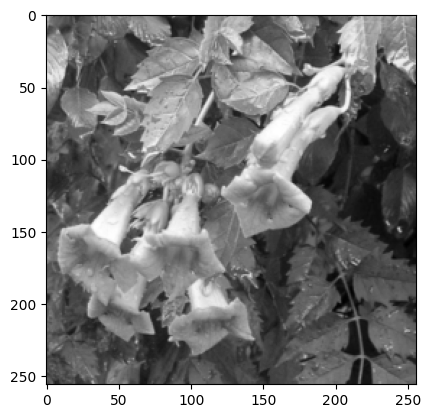

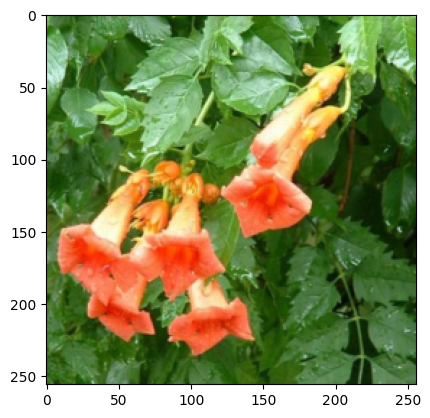

In [ ]:
data_iter = iter(train_loader)
images_grey, images_rgb = next(data_iter)

imshow(images_grey[0], images_rgb[0],True)
imshow(images_grey[0],images_rgb[0])

# **UNet**

In [ ]:
#complete the code
class UNet(nn.Module):
    def __init__(self, kernel, num_filters, num_colours=3, num_in_channels=1):
        super().__init__()

        padding = kernel // 2

        self.downconv1 = nn.Sequential(
            nn.Conv2d(1, num_filters, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters),
            nn.ReLU())

        # out: n x 32 x 32
        # out1: n x 16 x 16

        self.downconv2 = nn.Sequential(
            nn.Conv2d(num_filters, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU())

        # out2: 2n x  16 x 16
        # out3: 2n x  8 x 8

        self.downconv3 = nn.Sequential(
            nn.Conv2d(num_filters*2, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU())

        # out4: 4n x  8 x 8
        # out5: 4n x  4 x 4


        self.rfconv = nn.Sequential(
            nn.Conv2d(num_filters*4, num_filters*8, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*8),
            nn.ReLU())

        # out6: 8n x  4 x 4
        # out7: 8n x  2 x 2

        self.maxp=nn.MaxPool2d(2)

        self.final_act = nn.Tanh()

        self.upconv=nn.Sequential(
            nn.Conv2d(num_filters*8, num_filters*8, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*8),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        # out8: 4n x  4 x 4

        # skip connection decoder layer
        self.skip = nn.Sequential(
            nn.Conv2d(num_filters*16, num_filters*4, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*4),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        # out8+out6: 16n x 4 x 4
        # outskip1: 4n x 8 x 8

        self.skip1 = nn.Sequential(
            nn.Conv2d(num_filters*8, num_filters*2, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters*2),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        # outskip1+out4: 8n x 8 x 8
        # outskip2: 2n x 16 x 16

        self.skip2 = nn.Sequential(
            nn.Conv2d(num_filters*4, num_filters, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(num_filters),
            nn.ReLU(),
            nn.Upsample(scale_factor=2))

        # outskip2+out2:  4n x 16 x 16
        # outskip3: n x 32 x 32

        self.skip3 = nn.Sequential(
            nn.Conv2d(num_filters*2, 3, kernel_size=kernel, padding=padding),
            nn.BatchNorm2d(3),
            nn.ReLU())

        # outskip3+out: 2n x 32 x 32
        # outskip3: 3 x 32 x 32

        self.skip4 = nn.Sequential(
            nn.Conv2d(3, 2, kernel_size=kernel, padding=padding))

        # out: 2 x 32 x 32
        self.final_act = nn.Tanh()
    def forward(self, x):

        # 1x32x32

        out = self.downconv1(x) # nx32x32
        out1=self.maxp(out) # nx16x16

        out2 = self.downconv2(out1) # 2nx16x16
        out3=self.maxp(out2) # 2nx8x8

        out4 = self.downconv3(out3) # 4nx8x8
        out5=self.maxp(out4) # 4nx4x4

        out6 = self.rfconv(out5) # 8nx4x4
        out7=self.maxp(out6)  #8n x2x2

        out8=self.upconv(out7) #8n x4x4

        #16n x4x4
        out_skip1=self.skip(torch.cat((out8,out6),dim=1))
        #4n x8x8

        #8n x8x8
        out_skip2=self.skip1(torch.cat((out4,out_skip1),dim=1))
        #8n x16x16

        #4n x16x16
        out_skip3=self.skip2(torch.cat((out2,out_skip2),dim=1))
        #n x32x32

        #2n x32x32
        out_skip4=self.skip3(torch.cat((out,out_skip3),dim=1))
        #3 x32x32

        out=self.skip4(out_skip4)

        out=self.final_act(out)
        return out


In [ ]:
from torchsummary import summary
model=UNet(3,32)
model=model.to('cuda')
summary(model,(1,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 256, 256]             320
       BatchNorm2d-2         [-1, 32, 256, 256]              64
              ReLU-3         [-1, 32, 256, 256]               0
         MaxPool2d-4         [-1, 32, 128, 128]               0
            Conv2d-5         [-1, 64, 128, 128]          18,496
       BatchNorm2d-6         [-1, 64, 128, 128]             128
              ReLU-7         [-1, 64, 128, 128]               0
         MaxPool2d-8           [-1, 64, 64, 64]               0
            Conv2d-9          [-1, 128, 64, 64]          73,856
      BatchNorm2d-10          [-1, 128, 64, 64]             256
             ReLU-11          [-1, 128, 64, 64]               0
        MaxPool2d-12          [-1, 128, 32, 32]               0
           Conv2d-13          [-1, 256, 32, 32]         295,168
      BatchNorm2d-14          [-1, 256,

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def imshow(y_channel,uv_channels,gray=False):


    y_channel = y_channel / 2.0 + 0.5
    uv_channels=uv_channels / 2.0 + 0.5

    if gray:
        plt.imshow(np.transpose(y_channel, (1, 2, 0)),cmap='gray')
    else:
        yuv_image = np.concatenate((y_channel, uv_channels), axis=0)
        yuv_image=np.transpose(yuv_image, (1, 2, 0))
        rgb_image = cv2.cvtColor(yuv_image, cv2.COLOR_YUV2RGB)
        plt.imshow(rgb_image)

    plt.axis('off')

def display_predictions(grayscale, sample_color, predicted, n=5):
    #plt.figure(figsize=(15, 10))

    for i in range(n):
        plt.subplot(3, n, i + 1)  # Display grayscale images in the first row
        imshow(grayscale[i].cpu(),sample_color[i].cpu(), True)

        plt.subplot(3, n, i + 1 + n)  # Display sample color images in the second row
        imshow(grayscale[i].cpu(),sample_color[i].cpu())  # Assuming sample_color images are already in CPU and normalized

        plt.subplot(3, n, i + 1 + 2 * n)  # Display predicted color images in the third row
        imshow(grayscale[i].cpu(),predicted[i].cpu())  # Assuming predicted images are already in CPU and normalized

    # plt.savefig(f'visualize/epoch{num}.png')
    plt.show()


In [ ]:
data_iter = iter(validation_loader)
sample_gray, sample_color = next(data_iter)
sample_gray, sample_color = sample_gray[:5], sample_color[:5]

In [ ]:
def test_unet(loader):

  losses=0
  for i, (xs, ys) in enumerate(loader):

          images=xs.cuda()
          labels=ys.cuda()
          outputs = model(images)
          loss = criterion(outputs, labels)
          losses+=loss.item()
  return losses/len(loader);


In [ ]:
def plot_losses_unet(epochs,train_losses,test_losses, valid_losses):

    epochs = list(range(1, epochs + 1))
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, label='Training')
    plt.plot(epochs, test_losses, label='Testing ')
    plt.plot(epochs, valid_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    #plt.show()


# L2 Loss

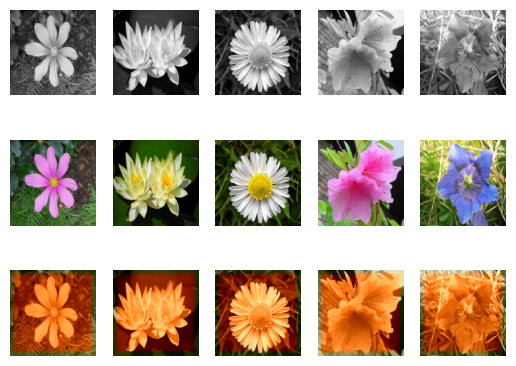

0 0.17792855203151703


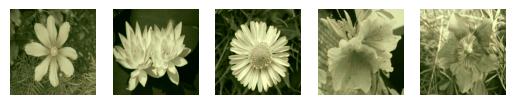

1 0.05167808756232262


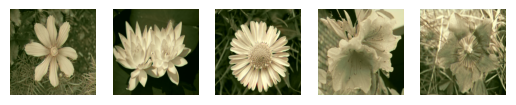

2 0.04930667579174042


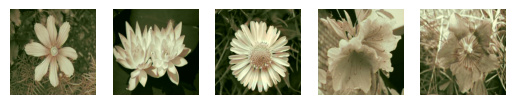

3 0.04848947748541832


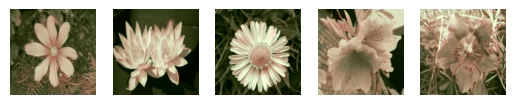

4 0.04665333777666092


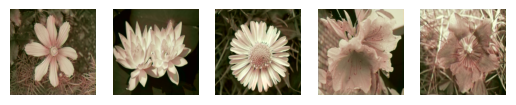

5 0.04572300612926483


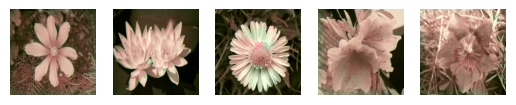

6 0.045755427330732346


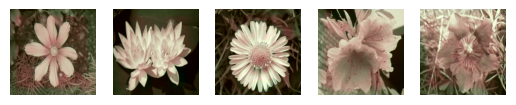

7 0.044244199991226196


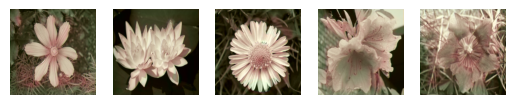

8 0.043842706829309464


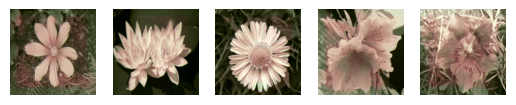

9 0.043421611189842224


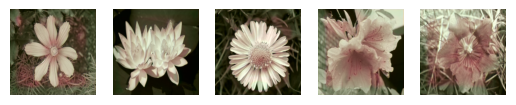

10 0.04318989813327789


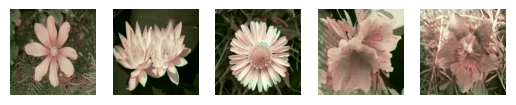

11 0.0441194549202919


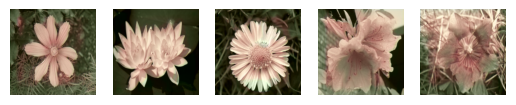

12 0.04226713255047798


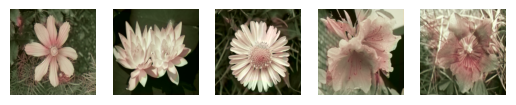

13 0.042425379157066345


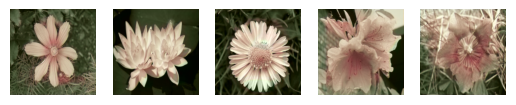

14 0.042788174003362656


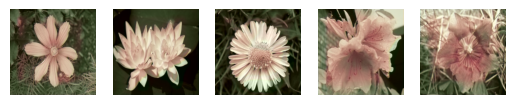

15 0.04214996472001076


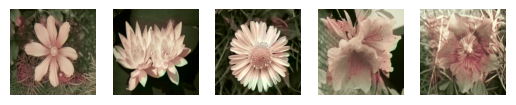

16 0.04156843572854996


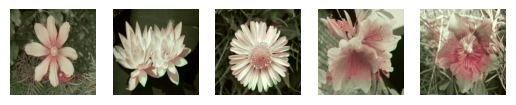

17 0.042559947818517685


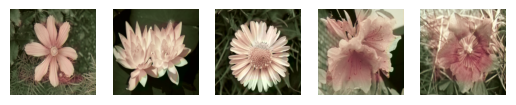

18 0.041570357978343964


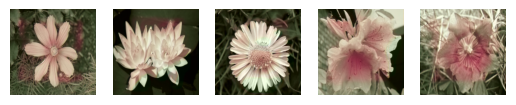

19 0.040780723094940186


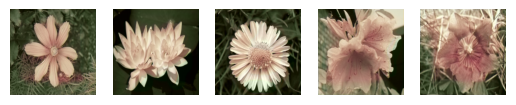

20 0.04225728660821915


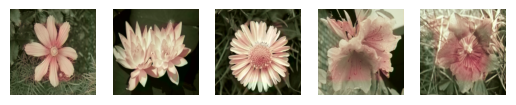

21 0.04096079245209694


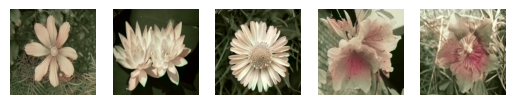

22 0.04188763350248337


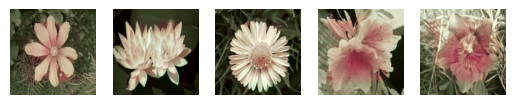

23 0.040395066142082214


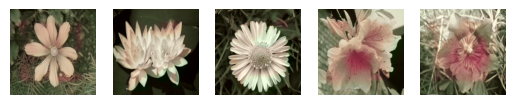

24 0.04098484665155411


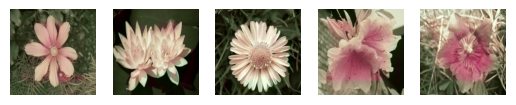

25 0.04128049314022064


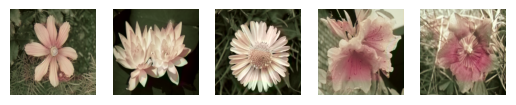

26 0.040925830602645874


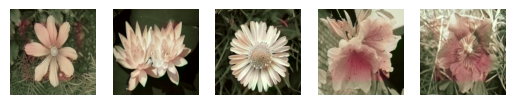

27 0.04032931104302406


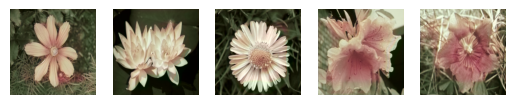

28 0.04162710905075073


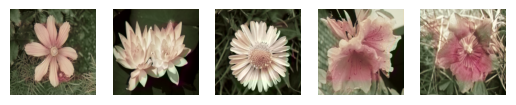

29 0.040766019374132156


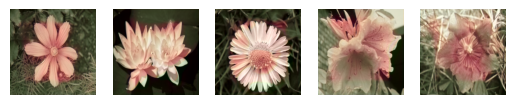

30 0.040982771664857864


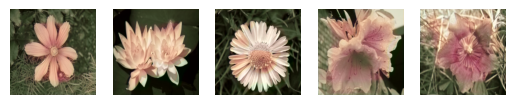

31 0.04114628955721855


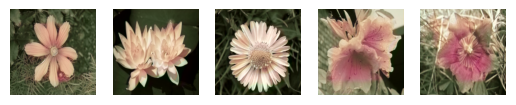

32 0.04052300006151199


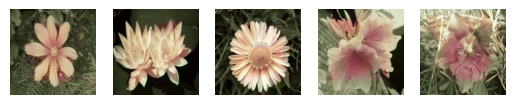

33 0.03858072683215141


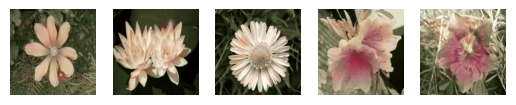

34 0.03955405205488205


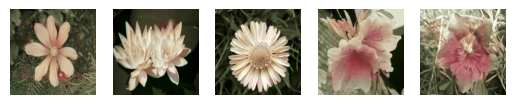

35 0.039686910808086395


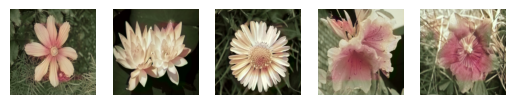

36 0.03883078694343567


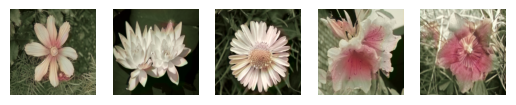

37 0.039700303226709366


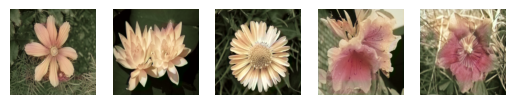

38 0.038903944194316864


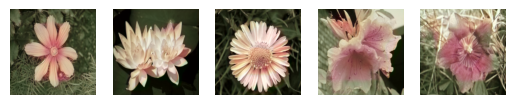

39 0.039924655109643936


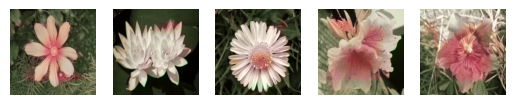

40 0.04168467968702316


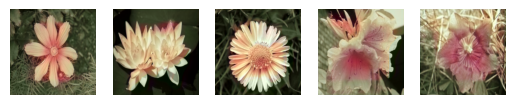

41 0.03991784527897835


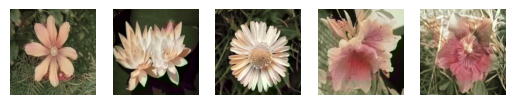

42 0.039464373141527176


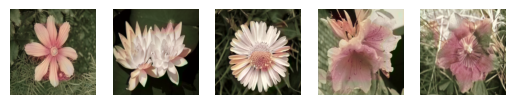

43 0.03943441063165665


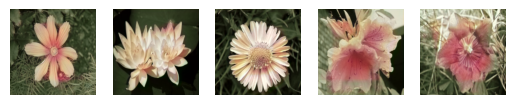

44 0.039710842072963715


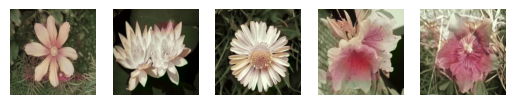

45 0.040129173547029495


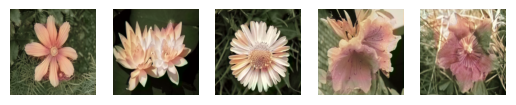

46 0.040240608155727386


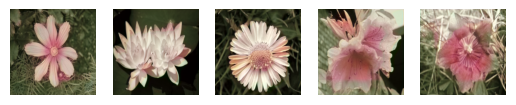

47 0.04076586663722992


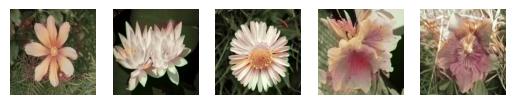

48 0.038863759487867355


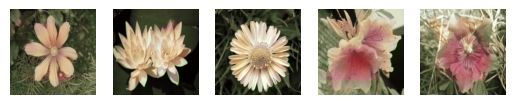

49 0.03829964995384216


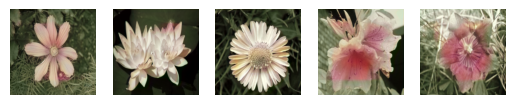

50 0.038747478276491165


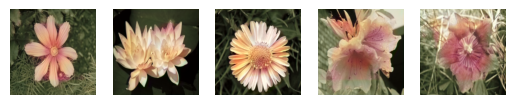

51 0.039136871695518494


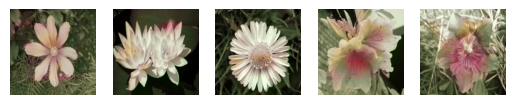

52 0.03898031264543533


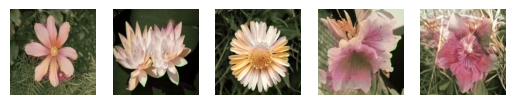

53 0.04075678437948227


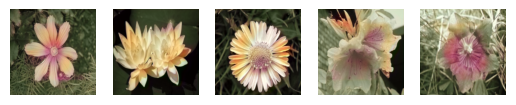

54 0.04069102928042412


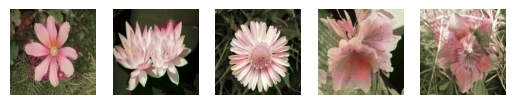

55 0.03826630488038063


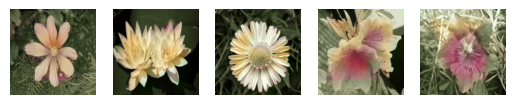

56 0.038394320756196976


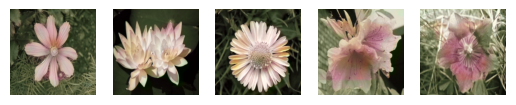

57 0.038682494312524796


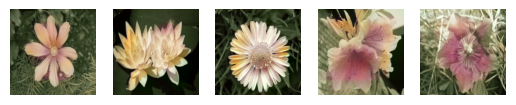

58 0.039899155497550964


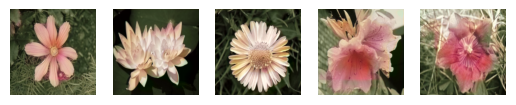

59 0.04177536442875862


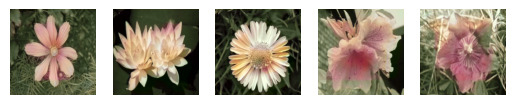

60 0.038227472454309464


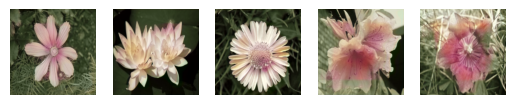

61 0.04050116613507271


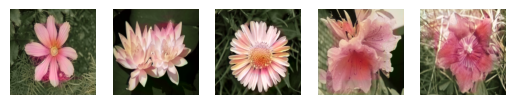

62 0.04355597868561745


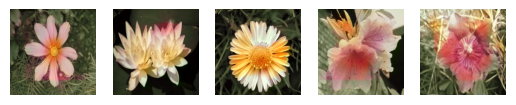

63 0.043674249202013016


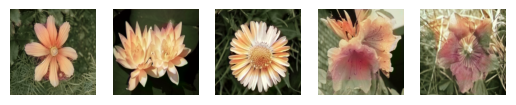

64 0.03711868077516556


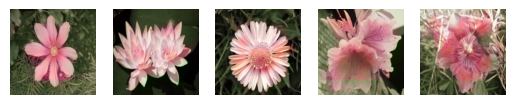

65 0.04289919137954712


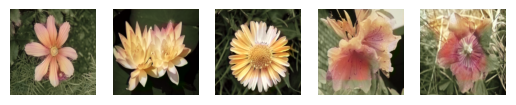

66 0.03752870485186577


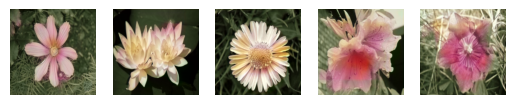

67 0.03787495940923691


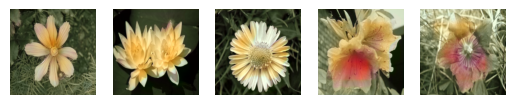

68 0.03907952457666397


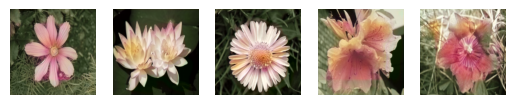

69 0.040690306574106216


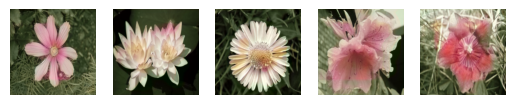

70 0.0403449721634388


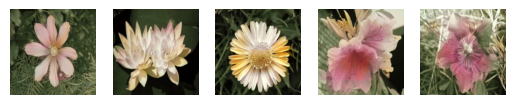

71 0.03892948850989342


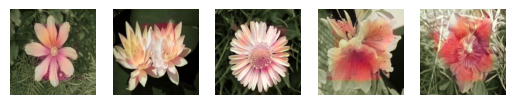

72 0.04145500808954239


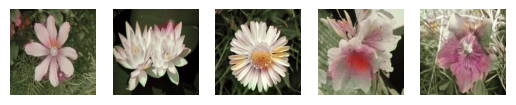

73 0.039015285670757294


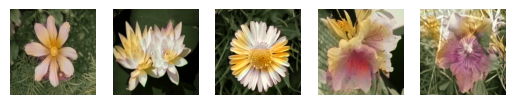

74 0.03864869475364685


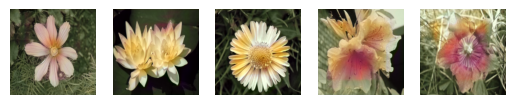

75 0.03720959275960922


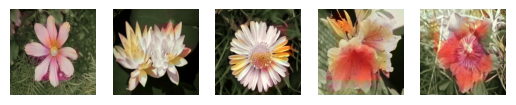

76 0.04595134034752846


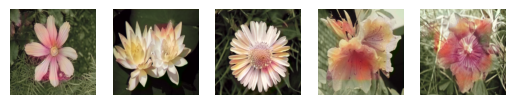

77 0.039507415145635605


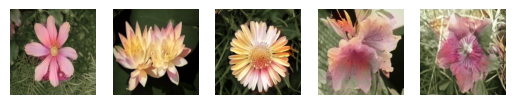

78 0.03990163654088974


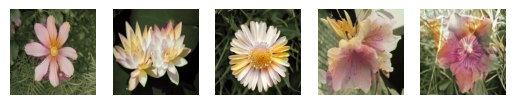

79 0.03826511651277542


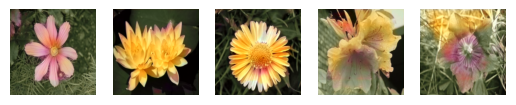

80 0.04364345595240593


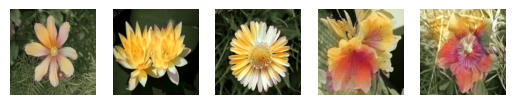

81 0.038585856556892395


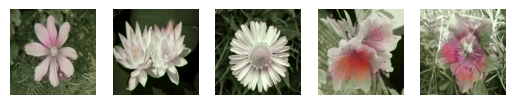

82 0.04316888749599457


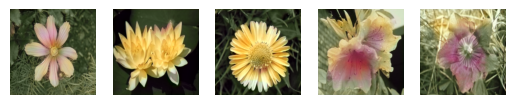

83 0.039118893444538116


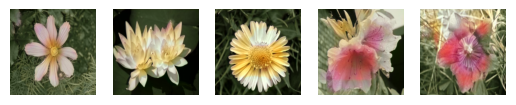

84 0.04089317470788956


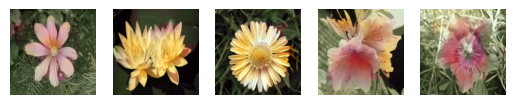

85 0.036348845809698105


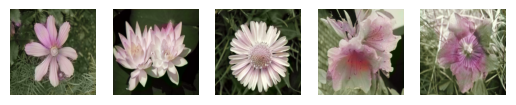

86 0.03948742523789406


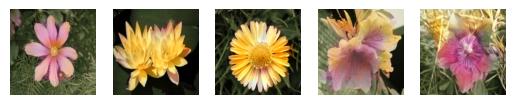

87 0.039462070912122726


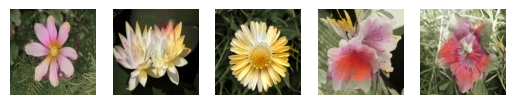

88 0.03823034465312958


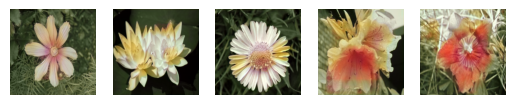

89 0.03921295329928398


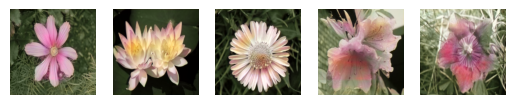

90 0.036629121750593185


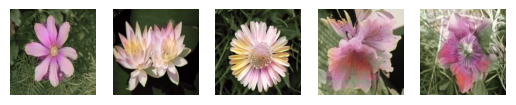

91 0.03734532371163368


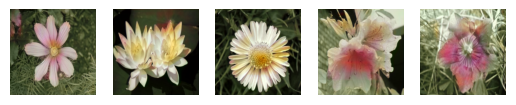

92 0.03658502921462059


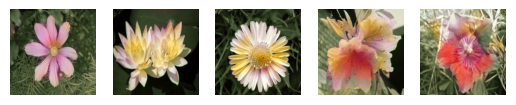

93 0.0377192422747612


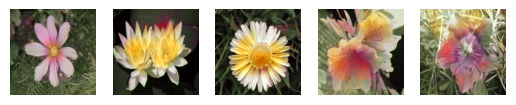

94 0.03787807747721672


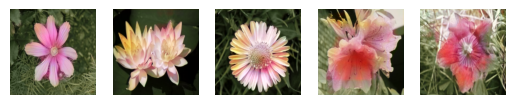

95 0.0390804298222065


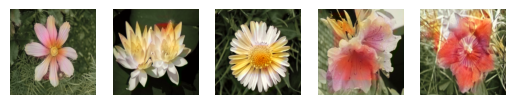

96 0.042856670916080475


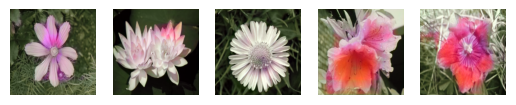

97 0.04705748334527016


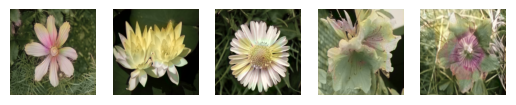

98 0.0434136688709259


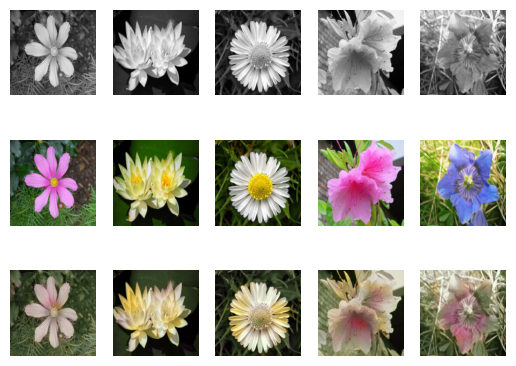

99 0.040471747517585754


In [ ]:
# LOSS FUNCTION
lr=0.0005
epochs=100

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

train_losses = []
valid_losses = []
test_losses = []

for epoch in range(epochs):
    # Train the Model
    total_loss = 0.0

    model.train()  # Change model to 'train' mode
    for i, (xs, ys) in enumerate(train_loader):

        images=xs.cuda()
        labels=ys.cuda()
        # Forward + Backward + Optimize
        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    average_loss = total_loss / len(train_loader)

    # Generate and display predictions after each epoch
    model.eval()
    with torch.no_grad():
        predicted_color_images = model(sample_gray.cuda())
        if (epoch==0) or (epoch==epochs-1):
            display_predictions(sample_gray, sample_color, predicted_color_images, n=5)
        else:
            n=5
            for i in range(5):
                plt.subplot(3, n, i + 1 + 2 * n)  # Display predicted color images in the third row
                imshow(sample_gray[i].cpu(),predicted_color_images[i].cpu())  # Assuming predicted images are already in CPU and normalized
            plt.show()

        valid_losses.append(test_unet(validation_loader))
        test_loss=test_unet(test_loader)
        test_losses.append(test_loss)

    train_losses.append(average_loss)

    print(epoch, test_loss)



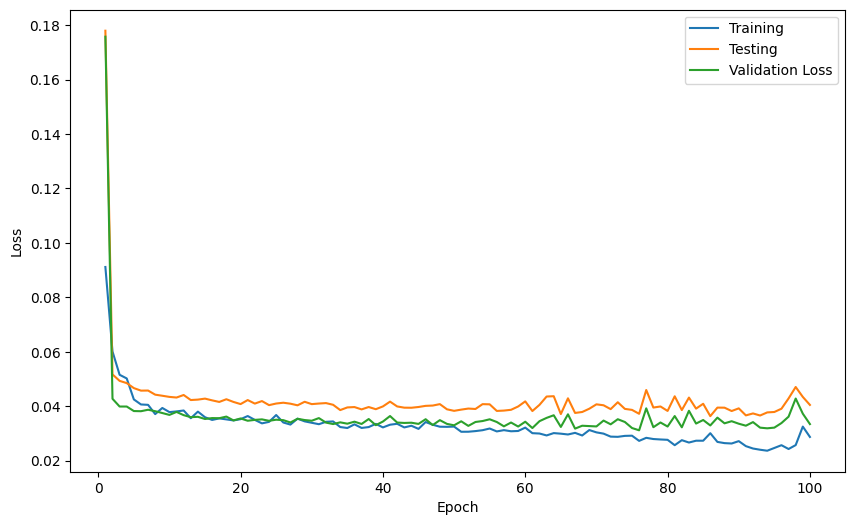

In [ ]:
plot_losses_unet(epochs,train_losses,test_losses, valid_losses)

In [ ]:
def display_predictions_test(grayscale, sample_color, predicted, n,name):
    #plt.figure(figsize=(15, 10))

    for i in range(n):
        plt.subplot(3, n, i + 1)  # Display grayscale images in the first row
        imshow(grayscale[i].cpu(),sample_color[i].cpu(), True)

        plt.subplot(3, n, i + 1 + n)  # Display sample color images in the second row
        imshow(grayscale[i].cpu(),sample_color[i].cpu())  # Assuming sample_color images are already in CPU and normalized

        plt.subplot(3, n, i + 1 + 2 * n)  # Display predicted color images in the third row
        imshow(grayscale[i].cpu(),predicted[i].cpu())  # Assuming predicted images are already in CPU and normalized

    plt.savefig(f'{name}.png')
    plt.show()

In [ ]:
epoch = 20

In [ ]:
# Save the model state and optimizer state
state = {
    # 'epoch': epoch,
    'model_state': model.state_dict(),
    'optimizer_state': optimizer.state_dict(),
}

# Save to a file
torch.save(state, 'model_checkpoint_yuv_small_dataset_complex.pth')

# **Load Saved Model to colorize images**

In [ ]:
# Load the state
state = torch.load('/content/model_checkpoint_yuv_small_dataset_complex (2).pth')

# Restore the model and optimizer state
model.load_state_dict(state['model_state'])
# optimizer.load_state_dict(state['optimizer_state'])

# Continue training from the epoch and loss where you left off
# epoch = state['epoch']

<All keys matched successfully>

In [ ]:
data_iter = iter(train_loader)

In [ ]:
data_iter = iter(test_loader)

In [ ]:
data_iter = iter(validation_loader)

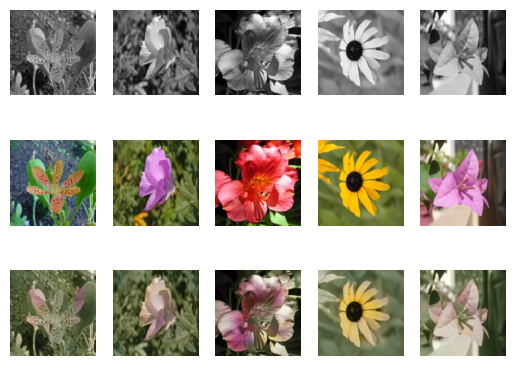

In [ ]:
sample_gray, sample_color = next(data_iter)
sample_gray, sample_color = sample_gray[:5], sample_color[:5]
# Generate and display predictions after each epoch
model.eval()
with torch.no_grad():
    predicted_color_images = model(sample_gray.cuda())
    display_predictions_test(sample_gray, sample_color, predicted_color_images, 5,'test2')